### Exploracion y Analisis de los datos

In [21]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
from ydata_profiling import ProfileReport 
%matplotlib inline

# Cargar datos
data = pd.read_csv('datos_limpios0.csv')
data.head()

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/01/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,1/01/2015,Quarter1,finishing,Thursday,1,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500
2,1/01/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,1/01/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,1/01/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382


In [22]:
data.shape

(1161, 15)

### Estadisticas Descriptivas

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1161 entries, 0 to 1160
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   date                   1161 non-null   object 
 1   quarter                1161 non-null   object 
 2   department             1161 non-null   object 
 3   day                    1161 non-null   object 
 4   team                   1161 non-null   int64  
 5   targeted_productivity  1161 non-null   float64
 6   smv                    1161 non-null   float64
 7   wip                    1161 non-null   float64
 8   over_time              1161 non-null   int64  
 9   incentive              1161 non-null   int64  
 10  idle_time              1161 non-null   float64
 11  idle_men               1161 non-null   int64  
 12  no_of_style_change     1161 non-null   int64  
 13  no_of_workers          1161 non-null   float64
 14  actual_productivity    1161 non-null   float64
dtypes: f

In [24]:
data.describe()

,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000
mean,6.549526,0.727967,15.005392,665.411714,4572.291128,36.981051,0.752799,0.380706,0.155039,34.324720,0.726244
std,3.425236,0.098715,11.004686,1457.267094,3363.590376,162.234546,12.904809,3.318668,0.433603,22.184086,0.169550
min,1.000000,0.070000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.233705
25%,4.000000,0.700000,3.940000,0.000000,1440.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.650066
50%,7.000000,0.750000,15.260000,562.000000,3960.000000,0.000000,0.000000,0.000000,0.000000,34.000000,0.755167
75%,9.000000,0.800000,24.260000,1070.000000,6960.000000,50.000000,0.000000,0.000000,0.000000,57.000000,0.845458
max,12.000000,0.800000,54.560000,23122.000000,25920.000000,3600.000000,300.000000,45.000000,2.000000,89.000000,1.020000


In [25]:
data.isnull().sum()

date                     0
quarter                  0
department               0
day                      0
team                     0
targeted_productivity    0
smv                      0
wip                      0
over_time                0
incentive                0
idle_time                0
idle_men                 0
no_of_style_change       0
no_of_workers            0
actual_productivity      0
dtype: int64

In [26]:
data.duplicated().sum()

0

### Perfilamiento de datos

In [27]:
# Generar reporte de perfilamiento
profile = ProfileReport(data, title='Reporte de perfilamiento', explorative=True)
profile.to_file('reporte_perfilamiento.html')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Manejo de la variable Date.

In [28]:
# Convertir la columna 'Date' a tipo datetime
data['date'] = pd.to_datetime(data['date'], errors='coerce')

# Extraer día, mes y año de la columna 'Date'
data['Day'] = data['date'].dt.day
data['Month'] = data['date'].dt.month
data['Year'] = data['date'].dt.year

# Eliminar la columna 'Date'
data.drop(columns=['date'], inplace=True)

# Mostrar las primeras filas del DataFrame
data.head()

,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,Day,Month,Year
0,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,1,1,2015
1,Quarter1,finishing,Thursday,1,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500,1,1,2015
2,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
3,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
4,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382,1,1,2015


### Manejo de variables categoricas

In [29]:
# Realizo una copia del DataFrame original
data_encoded = data.copy()

# Codificar las columnas categóricas en la copia
data_encoded['quarter'] = data_encoded['quarter'].astype('category').cat.codes
data_encoded['day'] = data_encoded['day'].astype('category').cat.codes
data_encoded['team'] = data_encoded['team'].astype('category').cat.codes
data_encoded.head()

,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,Day,Month,Year
0,0,sweing,3,7,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,1,1,2015
1,0,finishing,3,0,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500,1,1,2015
2,0,sweing,3,10,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
3,0,sweing,3,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
4,0,sweing,3,5,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382,1,1,2015


<Axes: >

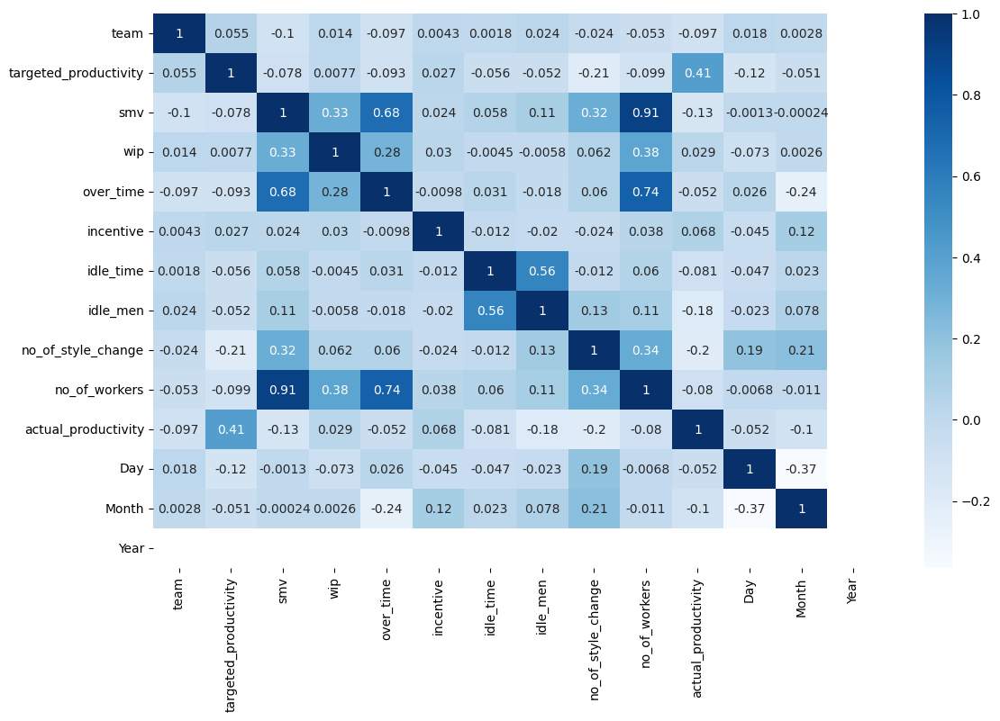

In [30]:
# Ajustar el tamaño de la figura
plt.figure(figsize=(13, 8))

# Excluir columnas no numéricas
numeric_data = data.select_dtypes(include=[float, int])

# Calcular la matriz de correlación
corr = numeric_data.corr()
sns.heatmap(corr, cmap="Blues", annot=True)

c:\Users\Jeronimo Vargas\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\Jeronimo Vargas\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Axes: >

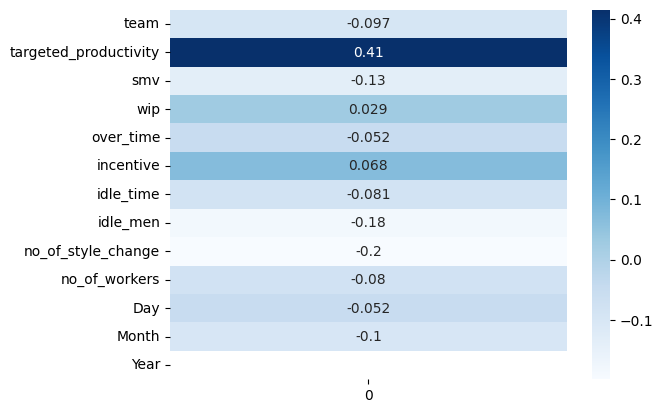

In [31]:
corrw = numeric_data.drop(['actual_productivity'], axis=1).corrwith(data['actual_productivity'])
sns.heatmap(pd.DataFrame(corrw), cmap="Blues", annot=True)

### Perfilamiento datos encoded y datetime manejados

In [32]:
data_encoded.describe()

,quarter,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,Day,Month,Year
count,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.0
mean,1.400517,2.527132,5.549526,0.727967,15.005392,665.411714,4572.291128,36.981051,0.752799,0.380706,0.155039,34.324720,0.726244,13.541774,1.723514,2015.0
std,1.212990,1.716400,3.425236,0.098715,11.004686,1457.267094,3363.590376,162.234546,12.904809,3.318668,0.433603,22.184086,0.169550,8.598728,0.752151,0.0
min,0.000000,0.000000,0.000000,0.070000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.233705,1.000000,1.000000,2015.0
25%,0.000000,1.000000,3.000000,0.700000,3.940000,0.000000,1440.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.650066,7.000000,1.000000,2015.0
50%,1.000000,3.000000,6.000000,0.750000,15.260000,562.000000,3960.000000,0.000000,0.000000,0.000000,0.000000,34.000000,0.755167,12.000000,2.000000,2015.0
75%,2.000000,4.000000,8.000000,0.800000,24.260000,1070.000000,6960.000000,50.000000,0.000000,0.000000,0.000000,57.000000,0.845458,21.000000,2.000000,2015.0
max,4.000000,5.000000,11.000000,0.800000,54.560000,23122.000000,25920.000000,3600.000000,300.000000,45.000000,2.000000,89.000000,1.020000,31.000000,3.000000,2015.0


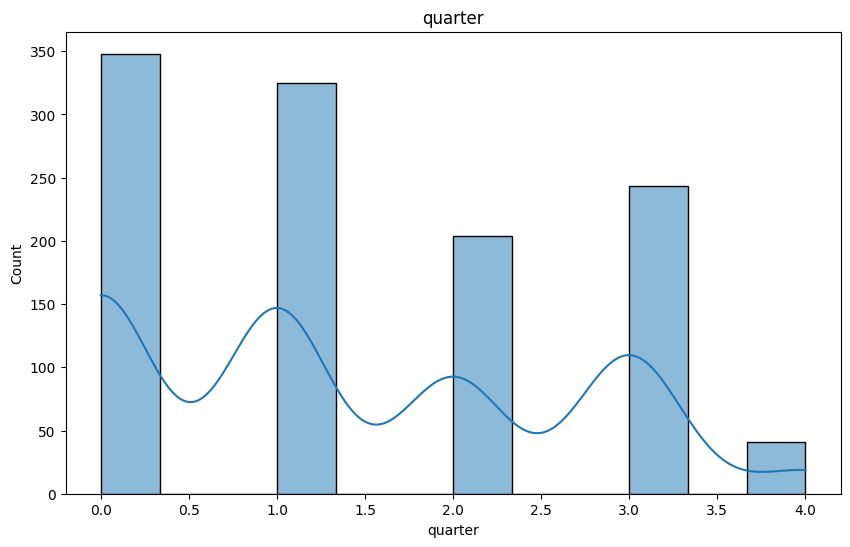

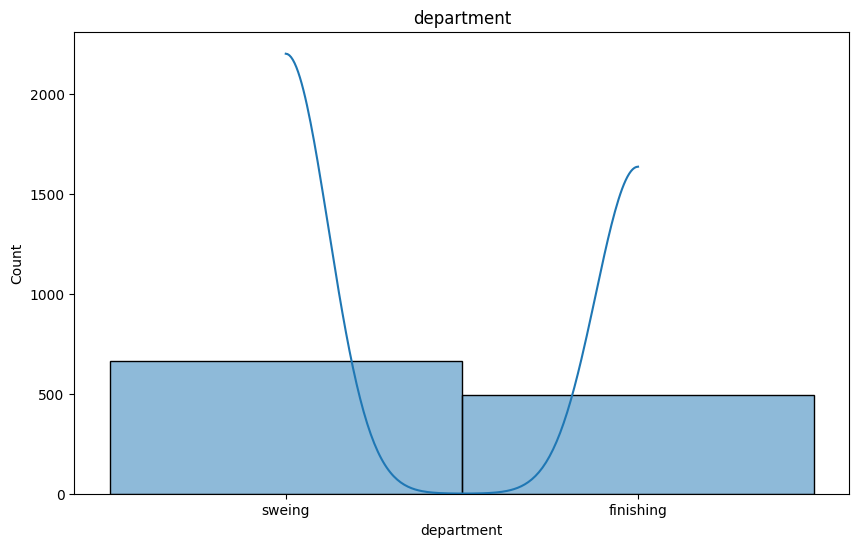

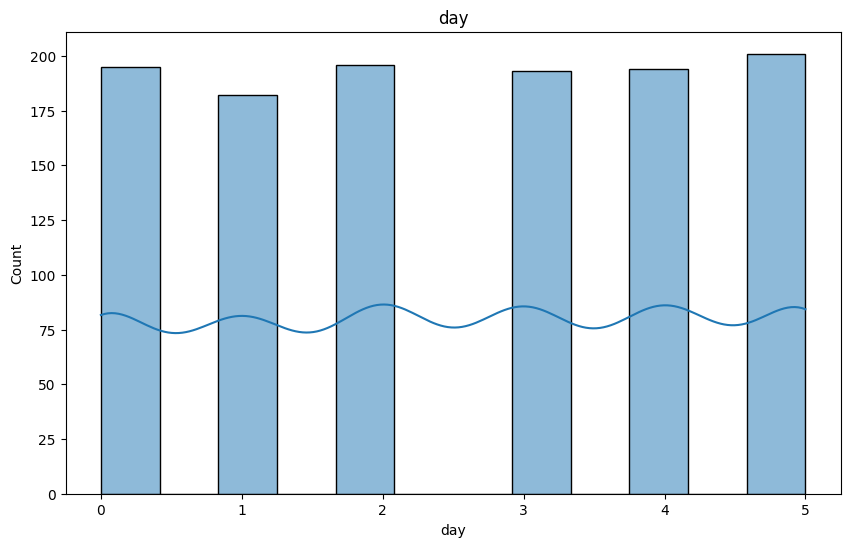

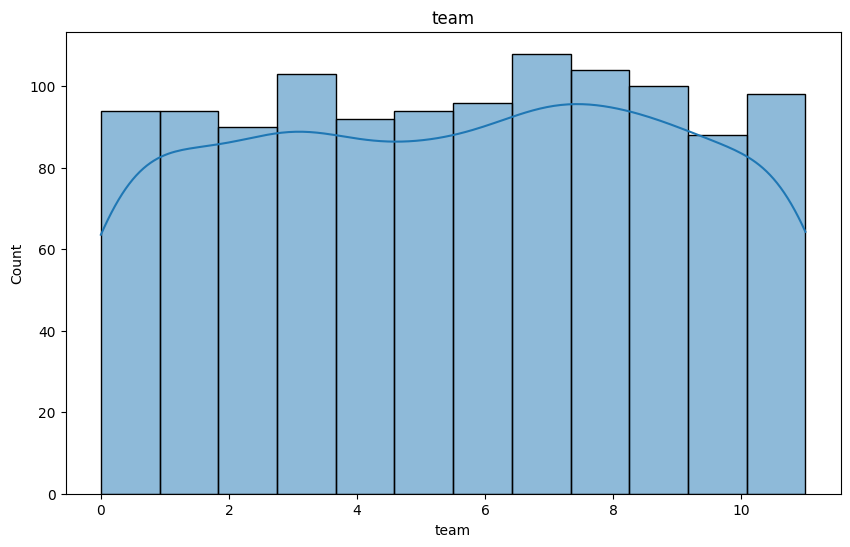

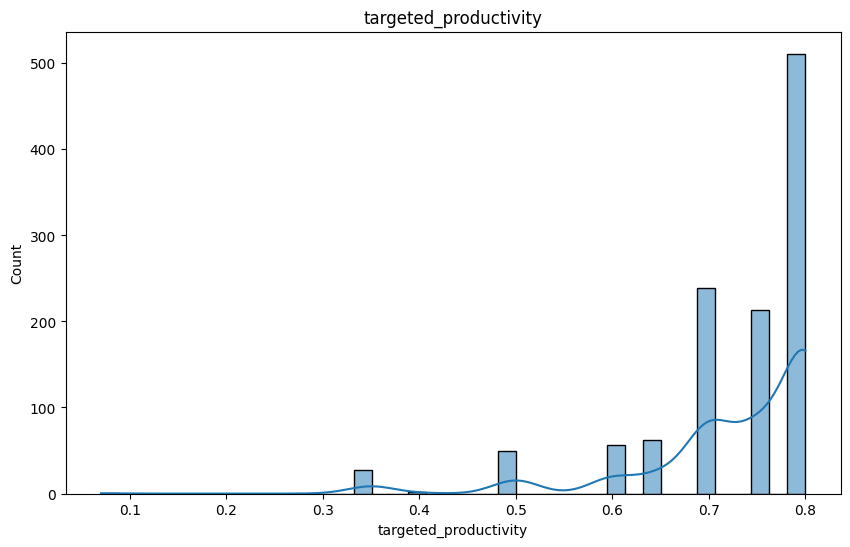

...

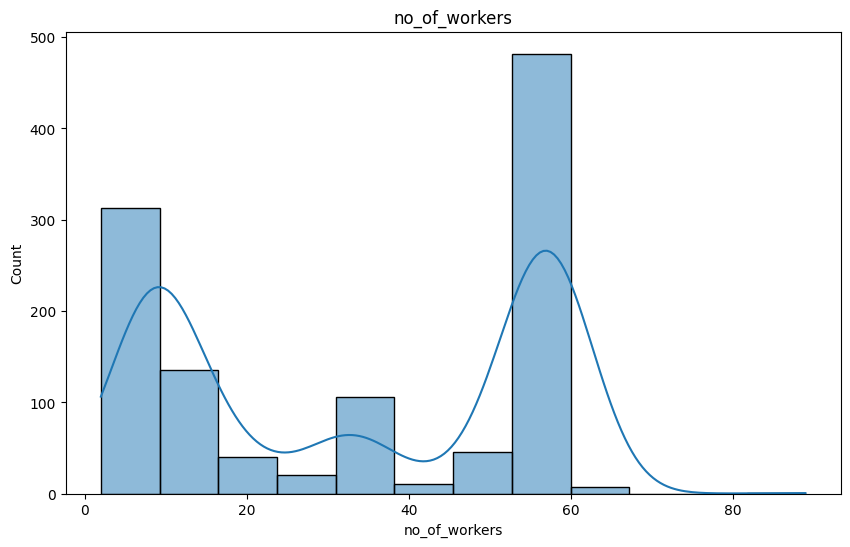

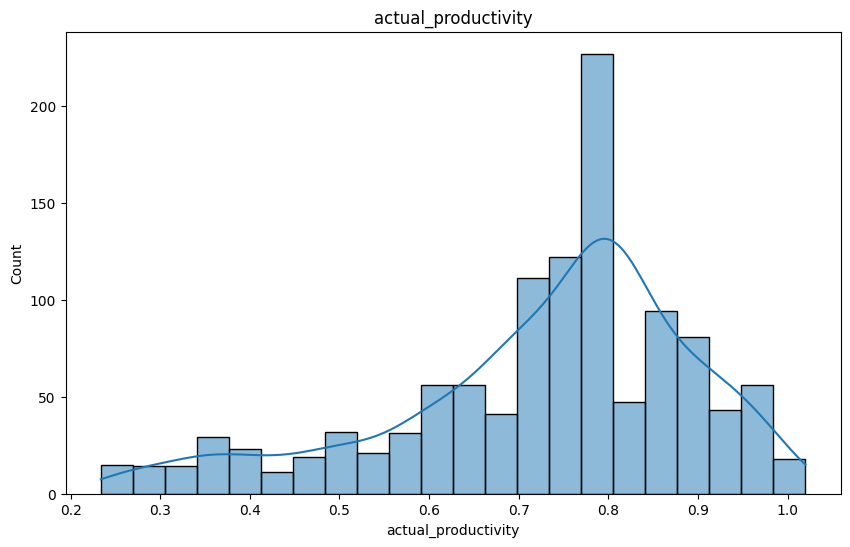

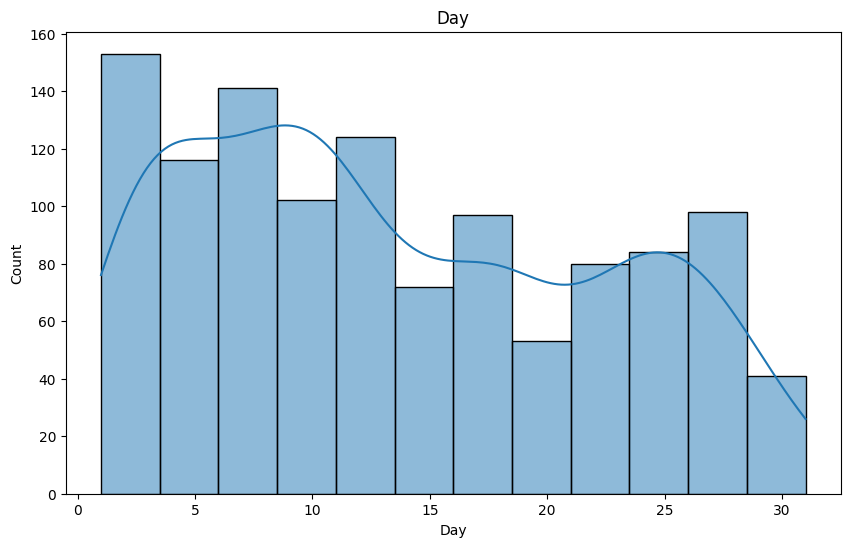

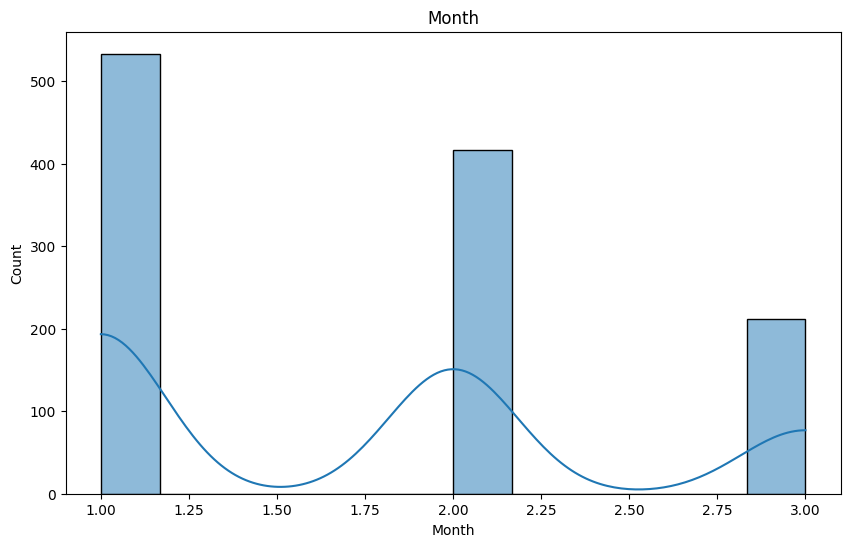

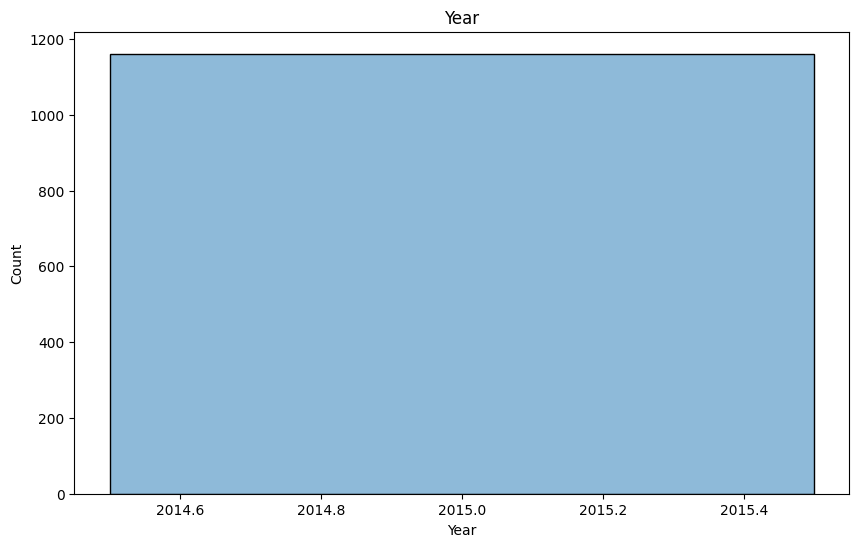

In [33]:
# Histogramas
for i in data_encoded.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data_encoded[i], kde=True)
    plt.title(i)
    plt.show()

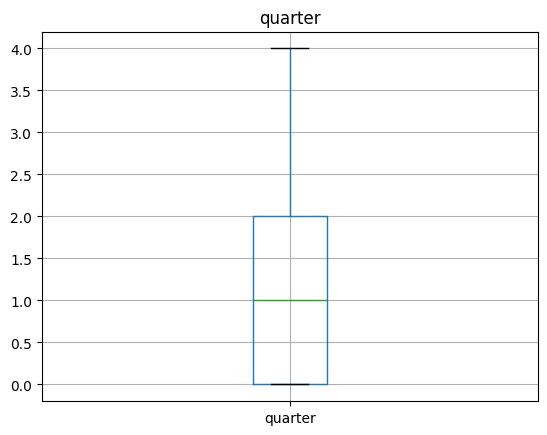

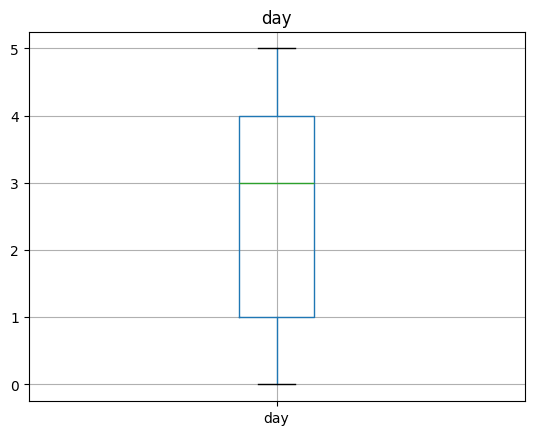

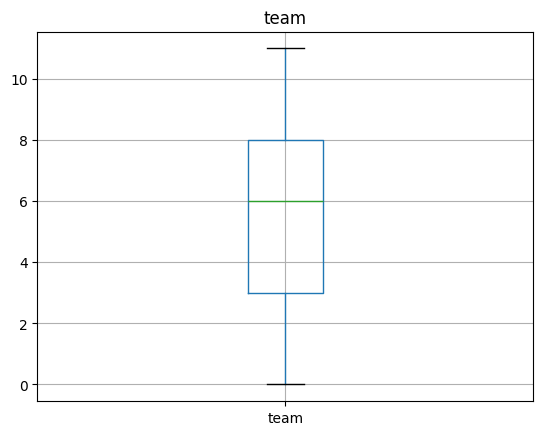

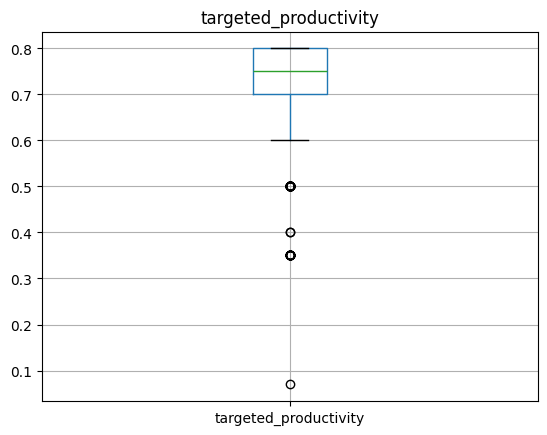

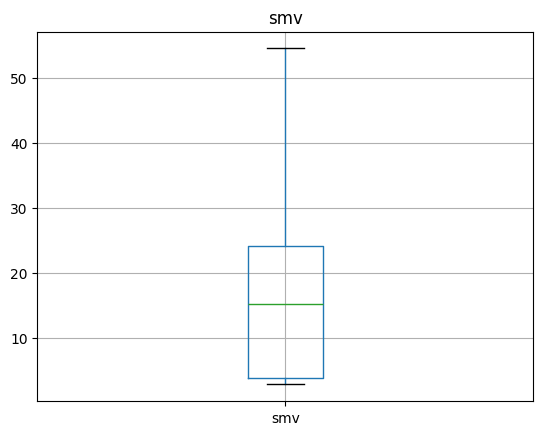

...

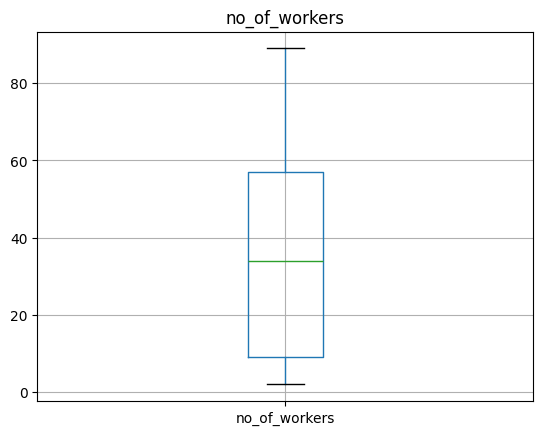

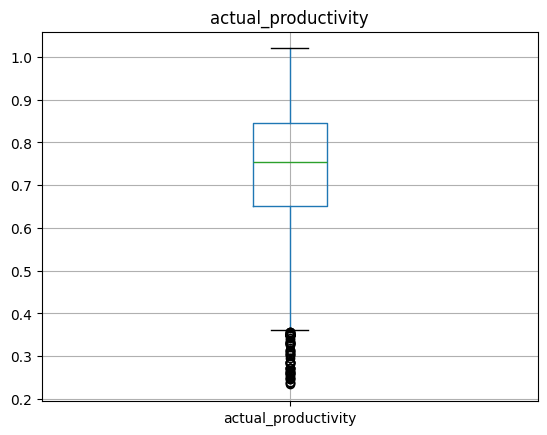

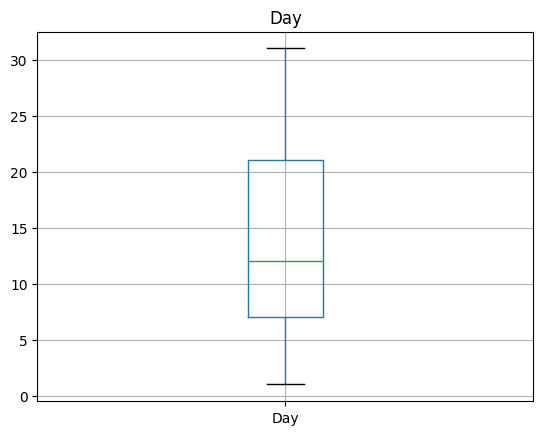

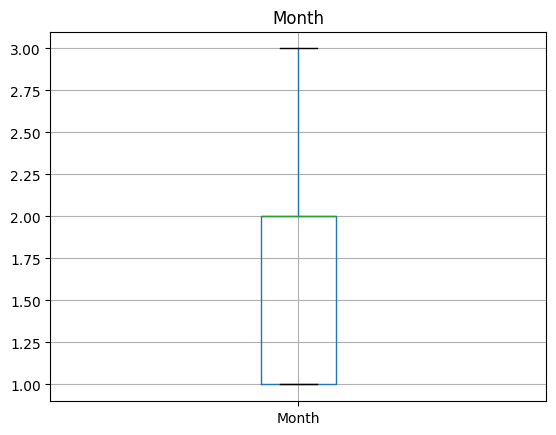

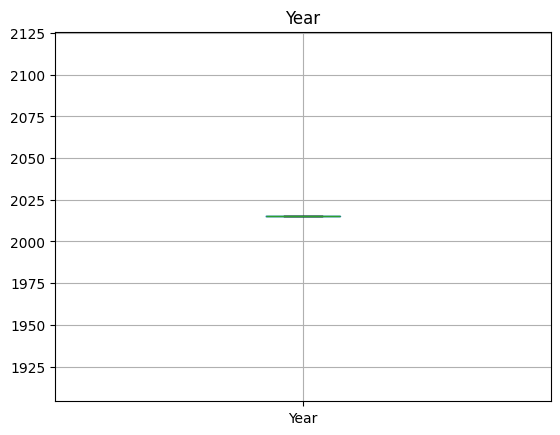

In [34]:
# Diagrama de cajas
for i in data_encoded.columns:
    if  not i == 'department': 
        data_encoded.boxplot(column=i)
        plt.title(i)
        plt.show()

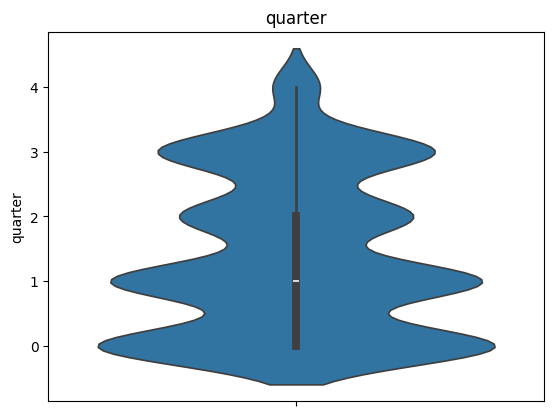

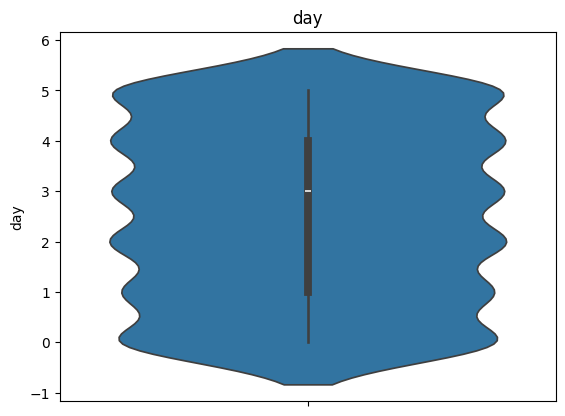

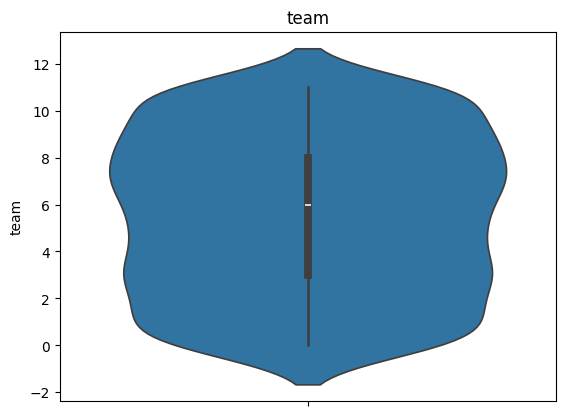

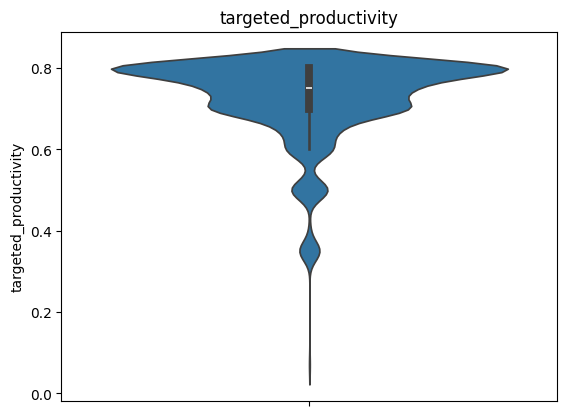

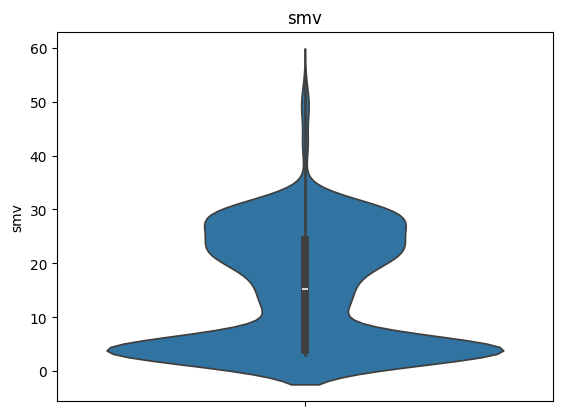

...

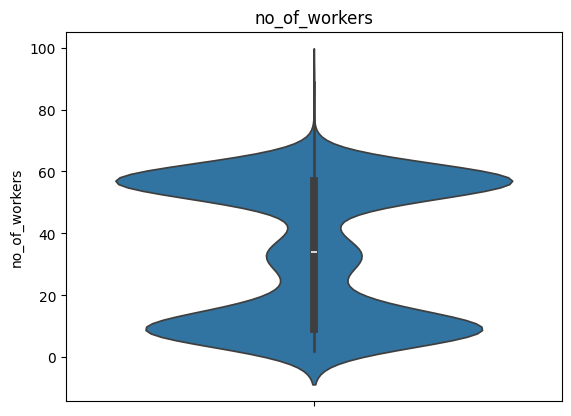

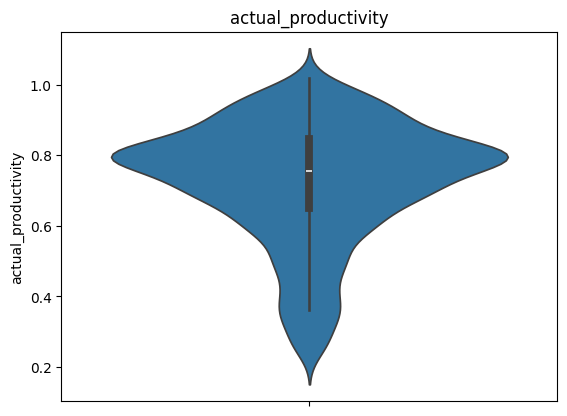

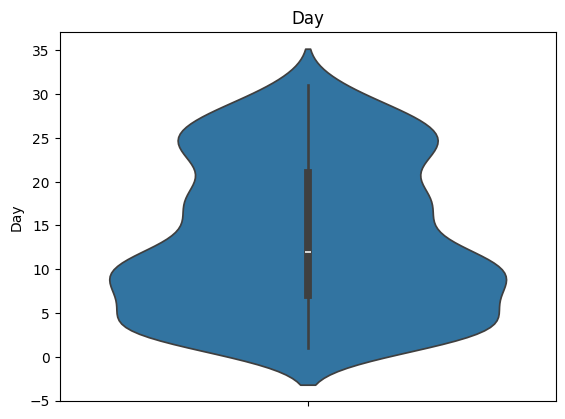

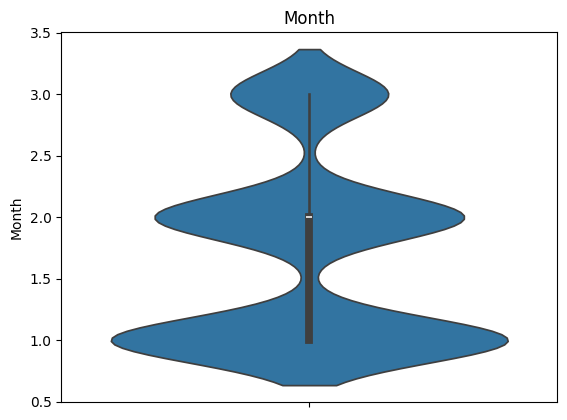

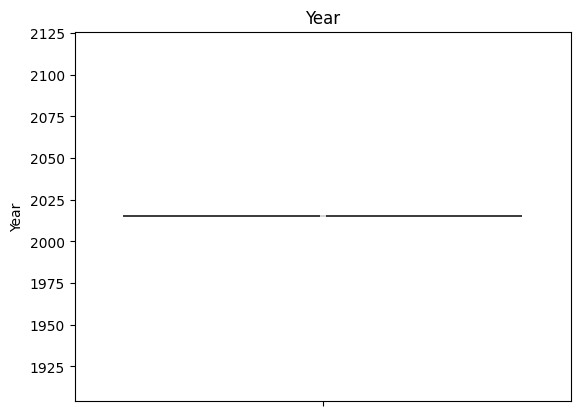

In [35]:
# Diagrama de violin
for i in data_encoded.columns:
    if  not i == 'department': 
        sns.violinplot(y=data_encoded[i])
        plt.title(i)
        plt.show()

### Diagramas de dispersión y tendencia entre variables de entrada y variable de respuesta

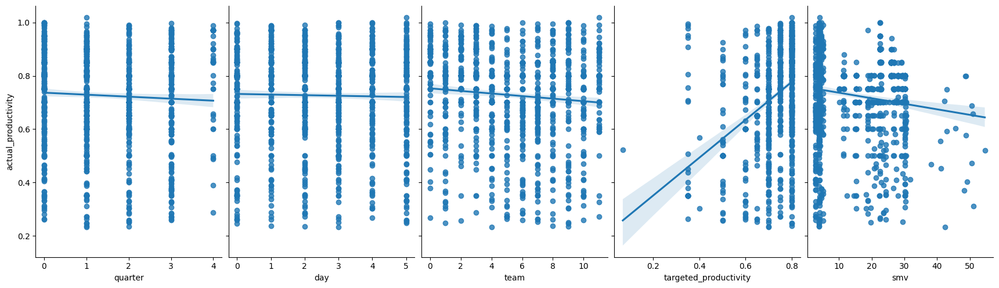

In [36]:
# quarter	department	day	team	targeted_productivity	smv	wip	over_time	incentive	idle_time	idle_men	no_of_style_change	no_of_workers	actual_productivity	Day	Month	Year
# Diagrama de dispersión de Querter hasta smv con respecto a la variable objetivo
import seaborn as sns
sns.pairplot(data_encoded, x_vars=['quarter', 'day', 'team', 'targeted_productivity', 'smv'], y_vars='actual_productivity', height=5, aspect=0.7, kind='reg')

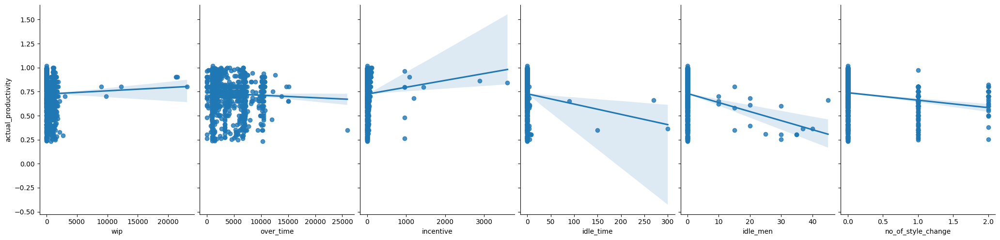

In [37]:
# diagrama de dispersión de wip hasta no_of_style_change con respecto a la variable objetivo
sns.pairplot(data_encoded, x_vars=['wip', 'over_time', 'incentive', 'idle_time', 'idle_men', 'no_of_style_change'], y_vars='actual_productivity', height=5, aspect=0.7, kind='reg')

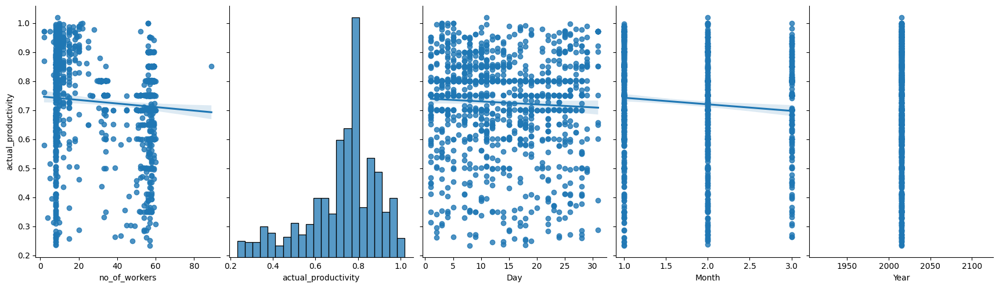

In [38]:
# Diagrama de dispersión de no_of_workers hasta Year con respecto a la variable objetivo
sns.pairplot(data_encoded, x_vars=['no_of_workers', 'actual_productivity', 'Day', 'Month', 'Year'], y_vars='actual_productivity', height=5, aspect=0.7, kind='reg')

In [39]:
# Perfilamiento 
profile = ProfileReport(data, title='Reporte de perfilamiento', explorative=True)
profile.to_file('reporte_perfilamiento_final.html')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Jeronimo Vargas\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 3 3 3]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Jeronimo Vargas\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 9 9 9]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Jeronimo Vargas\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]